# Custom Map Images with Cartopy

Vapor has a built-in image renderer that can be used to draw land beneath your visualization. However, if you load the data using XArray or if the dataset lacks georeferencing information, the geographic extent of the image renderer will be incorrect. In this guide we will create a map image with custom bounds and custom Cartopy features that can be displayed with Vapor's image renderer.

## Requirements

This guide requires vapor and cartopy libraries. To access NASA satellite images, you will also need owslib: \
\
```conda install -c conda-forge -c ncar-vapor vapor```\
```conda install conda-forge::cartopy```\
```conda install conda-forge::owslib``` 

In [1]:
# Data download:
import os
import requests
import zipfile

# Plotting libraries:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf

# Data handling:
import xarray as xr
import numpy as np

# Vapor:
from vapor import renderer, dataset, session

Vapor 3.9.3
Python 3.9.19 (/opt/anaconda3/envs/Feb18_vapor)
OpenGL 4.1 Metal - 83.1


We will also use vapor's Katrina sample dataset:

In [2]:
### This cell installs vapor's Katrina sample dataset ###
url = 'https://data.rda.ucar.edu/ds897.7/Katrina.zip'
extract_to = './data'
zip_name = "Katrina.zip"
data_file = './data/wrfout_d02_2005-08-29_02.nc'

# Check if the data file already exists
if not os.path.exists(data_file):
    # Download zip
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(zip_name, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                f.write(chunk)
    # Extract the file
    with zipfile.ZipFile(zip_name, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

    # Clean up the zip file
    os.remove(zip_name)

    print(f"Data downloaded and extracted to {data_file}")
else:
    print(f"Data file already exists at {data_file}, skipping download and extraction.")


Data file already exists at ./data/wrfout_d02_2005-08-29_02.nc, skipping download and extraction.


## Select Parameters for our Image

Specify where the new image file will be saved:

In [3]:
targetDir = ""
fileName = "Katrina_map_image"

Specify the lon/lat bounds of your image. Make sure it is exactly the same as the geographic extent of your dataset:

In [4]:
### If you know the extent of your dataset, you can set your bounds manually ###
# west = -95.8826
# north = 32.95732
# east = -82.84012
# south = 21.616137

### Or you can extract this information from your dataset ###
ds = xr.open_dataset("data/wrfout_d02_2005-08-29_02.nc")
west = np.min(ds["XLONG"].values)
east = np.max(ds["XLONG"].values)
south = np.min(ds["XLAT"].values)
north = np.max(ds["XLAT"].values)


Choose the size of your output figure. Note: If your specified lat/lon extents have a different aspect ratio than 
your width and height, the geotiff will have either of its dimensions scaled to 
match the aspect ratio of the specified extents of the west/north/east/south 
variables.


In [5]:
width = 1920
height = 1080
dpi = 42

**Optional:** to include a satellite image, identify the url and layer of the image. The following cell selects a Blue Marble image from NASA. (You can try other layers, like the VIIRS city lights layer)

In [6]:
url = "https://map1c.vis.earthdata.nasa.gov/wmts-geo/wmts.cgi"
layer = "BlueMarble_ShadedRelief"
# layer = 'VIIRS_CityLights_2012'

## Create a cartopy map

Set up your figure and optionally add a satellite image

/opt/anaconda3/envs/Feb18_vapor/lib/python3.9/site-packages/owslib/wmts.py:856: FutureWarning: The behavior of this method will change in future versions. Use specific 'len(elem)' or 'elem is not None' test instead.
  if current and current.text == 'true':
/opt/anaconda3/envs/Feb18_vapor/lib/python3.9/site-packages/owslib/wmts.py:653: RuntimeWarning: TileMatrixLimits with tileMatrix "1" already exists
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/Feb18_vapor/lib/python3.9/site-packages/owslib/wmts.py:653: RuntimeWarning: TileMatrixLimits with tileMatrix "2" already exists
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/Feb18_vapor/lib/python3.9/site-packages/owslib/wmts.py:653: RuntimeWarning: TileMatrixLimits with tileMatrix "3" already exists
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/Feb18_vapor/lib/python3.9/site-packages/owslib/wmts.py:653: RuntimeWarning: TileMatrixLimits with tileMatrix "4" already exists
  warnings.warn(msg, RuntimeWarning)
/op

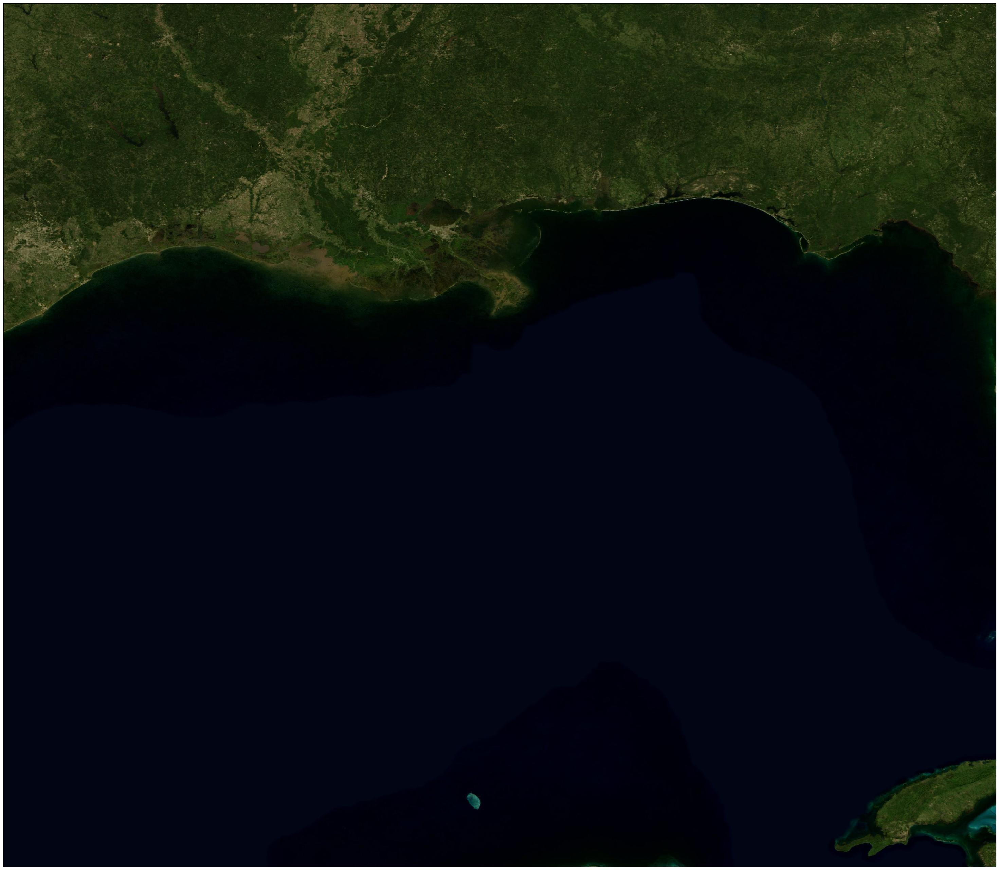

In [7]:
fig = plt.figure(
    figsize=(width/dpi, height/dpi), 
    tight_layout=True 
)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

ax.set_extent(
    [west, east, south, north], 
    crs=ccrs.PlateCarree()
)

ax.add_wmts(url, layer) # Adds the satellite image we chose in the previous cell. Remove this line for native Cartopy maps

## Add Cartopy Features

For this example, we'll add state borders, coastlines, and roads

In [8]:
# Borders
ax.add_feature(
    cf.STATES,
    edgecolor='darkgray', 
    facecolor='none',
    linewidth=3
)

In [9]:
# Coastlines
ax.add_feature(
    cf.COASTLINE,
    edgecolor='lightgray', 
    facecolor='none',
    linewidth=3
)

In [10]:
# Roads
ax.add_feature(
    cf.NaturalEarthFeature('cultural', 'roads_north_america', '10m'), 
    edgecolor='yellow', 
    facecolor='none'
)

## View and save image

In [11]:
# Save figure
tiffFile = targetDir + fileName + ".tif"
fig.savefig( tiffFile,
             bbox_inches='tight',
             pad_inches=0
)

/opt/anaconda3/envs/Feb18_vapor/lib/python3.9/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


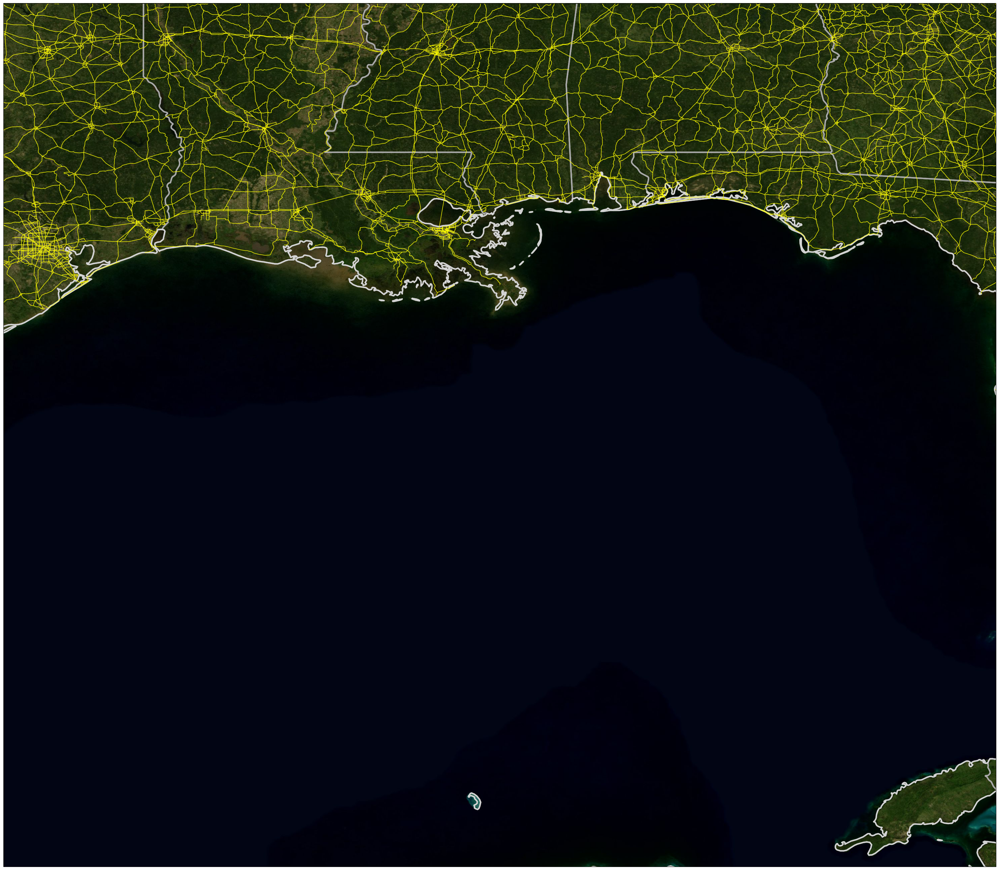

In [12]:
fig

## Example: loading the map as an image in Vapor

To view our map in Vapor, create an image renderer and set its path to the file we just created. \
**Important:** our image does not contain georeferencing information, to be sure the set 'IsGeoRef' to false

UNSUPPORTED (log once): POSSIBLE ISSUE: unit 5 GLD_TEXTURE_INDEX_3D is unloadable and bound to sampler type (Float) - using zero texture because texture unloadable


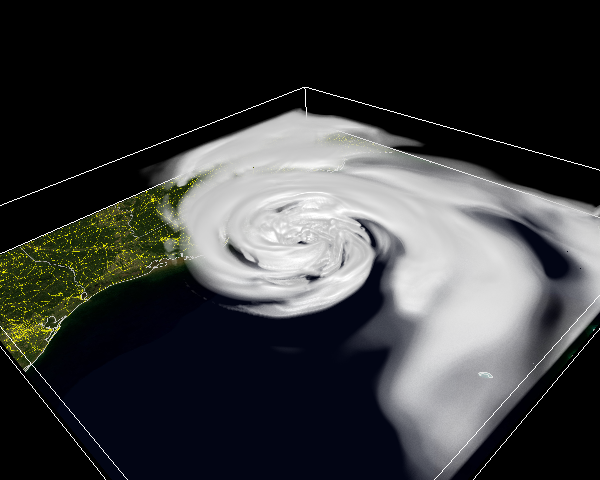

In [13]:
ses = session.Session()
data = ses.OpenDataset(dataset.WRF, ["data/wrfout_d02_2005-08-29_02.nc"])
image = data.NewRenderer(renderer.ImageRenderer)
image.SetImagePath("./Katrina_map_image.tif")
image.SetIsGeoRef(False)

# Add visualization of the hurricane's clouds
clouds = data.NewRenderer(renderer.VolumeRenderer) # Render clouds
clouds.SetVariableName("QCLOUD")
clouds_tf = clouds.GetTransferFunction("QCLOUD")
clouds_tf.LoadBuiltinColormap("Sequential/BlackWhite")
clouds_tf.SetColorRGBList([(r, g, b) for r, g, b, _ in 
                           list(reversed(clouds_tf.GetMatPlotLibColormap().colors))])
clouds_tf.SetOpacityControlPoints([[0,0],[0.00001,0.01], [0.0001, 0.1], [0.0010,0.9]])
ses.GetCamera().LookAt([-1190444, 1882360, 770176], [-420811, 2737271, 5699], [0.41853764, 0.35630071, 0.83538976])
ses.Show()